In [1]:
import os
import subprocess
from matplotlib import pyplot as plt
import numpy as np
import importlib
import copy
import statistics as stats
import random
import networkx as nx
import os
import seaborn as sns

Will store each family as a tuple (name, nseq, fc, tries)
tries=0 if failed 

In [2]:
def get_tuples(filename, train, test):
    tuples=[]
    with open(filename,"r") as fh:
        for y in fh:
            y=y.split()
            name=y[0]
            ns=int(y[3])
            fc=int(y[1][:-1])/100.0
            if len(y)==9:
                tries=int(y[8])
            elif len(y)==8:
                if int(y[5])>=train and int(y[6])>=test:
                    tries=1
                else: 
                    tries=0
            else:
                print(x)
                print(y)
                #raise ValueError("line doesn't have 8 or 9 columns...that's odd")
            tuples.append((name, ns, fc,tries))
            
    return tuples



In [3]:
def common_tuples(myres, train, test):
    all_tuples=[]
    print("families present for each algorithm")
    for r in myres:
        print(len(r))
        all_tuples+=r
    common_names=set([x[0] for x in blue]).intersection(set([x[0] for x in cobalt])).intersection(set([x[0] for x in cluster])).intersection(set([x[0] for x in random70]))   
    print("common families: "+str(len(common_names)))
    common_names_short=[]
    for x in all_tuples:
        if x[1]>=train+test and x[0] in common_names:
            common_names_short.append(x[0])
    common_names_short=set(common_names_short)
    print("common families with at least "+str(train+test)+" seqs: "+str(len(common_names_short)))
    
    common_res=[]
    for r in myres:
        nr=[]
        for t in r:
            if t[0] in common_names_short:
                nr.append(t)
        common_res.append(nr)
    
    return common_res


In [4]:
def truncate_tuples(myres, train, test):
    
    common_res=[]
    for r in myres:
        nr=[]
        for t in r:
            if t[1]>=train+test:
                nr.append(t)
        common_res.append(nr)
    
    return common_res

In [5]:
def pass_rate(tuples, i=1, den=False):
    s=0
    for t in tuples:
        if t[3]>0 and t[3]<=i:
            s+=1
    if den==False:
        den= len(tuples)
    return s/(den+0.0)

In [6]:
def pf_scatter(tuples, title='', tries=1, man_set=True):
    #plt.figure(dpi=100)
    passes_ns=[]
    fails_ns=[]
    passes_fc=[]
    fails_fc=[]
    for t in tuples:
        if t[3]>0 and t[3]<=tries:
            passes_ns.append(t[1])
            passes_fc.append(t[2])
        else:
            fails_ns.append(t[1])
            fails_fc.append(t[2])

    plt.scatter(fails_ns, fails_fc, s=20, marker='D', color='tab:red',facecolors='none', linewidth=.12)
    plt.scatter(passes_ns, passes_fc, s=30, marker='o',facecolors='none', edgecolors='tab:cyan',linewidth=.12)
    

    
    #plt.scatter(fails_ns, fails_fc, s=15, marker='o',facecolors='none',edgecolors='r')
    #plt.xlim(0,100)
    
    if man_set:
        plt.xlim(min(passes_ns+fails_ns)*.8,max(passes_ns+fails_ns)*1.2)
    fs=9
    plt.xlabel('Number of sequences in family',fontsize=fs)
    plt.xscale('log')
    plt.ylabel('Average connectivity',fontsize=fs)
    plt.title(title,fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)
    #plt.xlim(20,400)
    #plt.show()
    print("passed: "+str(len(passes_ns))+" failed: "+ str(len(fails_ns)))

In [7]:
train=10
test=2
path_seed="/n/home01/spetti/spetti_space/pass_rate_benchmark/splits/seed/"
path_full="/n/home01/spetti/spetti_space/pass_rate_benchmark/splits/full/"
blue=get_tuples(path_seed+"blue_seed.tbl", train, test)
cobalt=get_tuples(path_seed+"cobalt_seed.tbl",train, test)
cluster=get_tuples(path_seed+"cluster_seed.tbl",train, test)
random70=get_tuples(path_seed+"random70_seed.tbl",train, test)


myres=[blue,cobalt, cluster, random70]
t_res=truncate_tuples(myres, train, test)

s_blue=t_res[0]
s_cobalt=t_res[1]
s_cluster=t_res[2]
s_random70=t_res[3]  

In [20]:
#compute number that didn't terminate
for alg in ['blue','cobalt','cluster','random70']:
    print(alg)
    print(18102-len(get_tuples(path_full+alg+"_full.tbl", 0,0)))


blue
118
cobalt
1
cluster
2
random70
0


In [8]:
train=400
test=20

blue=get_tuples(path_full+"blue_full.tbl", train, test)
cobalt=get_tuples(path_full+"cobalt_full.tbl",train, test)
cluster=get_tuples(path_full+"cluster_full.tbl",train, test)
random70=get_tuples(path_full+"random70_full.tbl",train, test)


myres=[blue,cobalt, cluster, random70]
t_res=truncate_tuples(myres, train, test)
for t in t_res:
    print(len(t))
f_blue=t_res[0]
f_cobalt=t_res[1]
f_cluster=t_res[2]
f_random70=t_res[3]   

9709
9826
9825
9827


passed: 2965 failed: 6744
passed: 5208 failed: 4501
passed: 2792 failed: 7034
passed: 4928 failed: 4898
passed: 1373 failed: 8452
passed: 296 failed: 9531


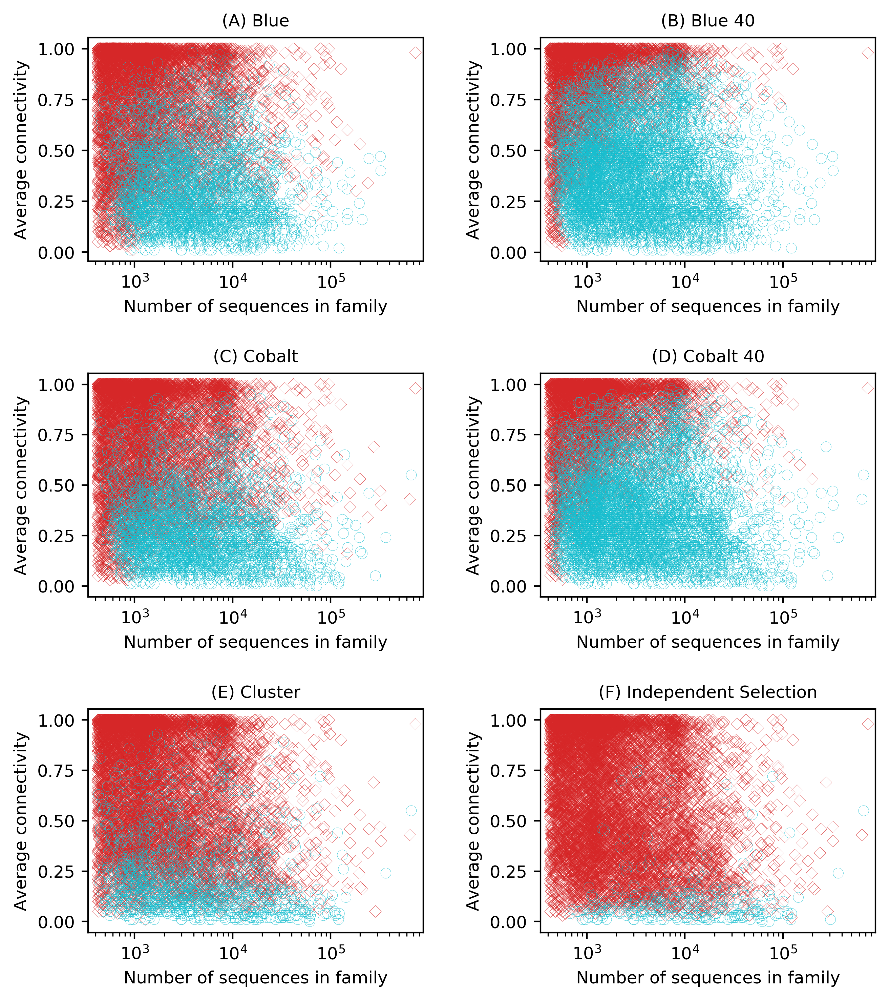

In [9]:
plt.figure( figsize=(7.5, 8.75), dpi=400)
#plt.subplots(sharex=True, sharey=True)
plt.subplots_adjust(hspace=.5, wspace=.35)
plt.subplot(321)
pf_scatter(f_blue, "(A) Blue",1)
plt.subplot(322)
pf_scatter(f_blue, "(B) Blue 40",40)
plt.subplot(323)
pf_scatter(f_cobalt,'(C) Cobalt',1)
plt.subplot(324)
pf_scatter(f_cobalt,  '(D) Cobalt 40',40)
plt.subplot(325)
pf_scatter(f_cluster, "(E) Cluster",1)
plt.subplot(326)
pf_scatter(f_random70,"(F) Independent Selection",1)
plt.savefig("/n/home01/spetti/figures/full_pf.pdf")

passed: 4247 failed: 8093
passed: 7381 failed: 4959
passed: 3578 failed: 8762
passed: 6893 failed: 5447
passed: 2363 failed: 9977
passed: 839 failed: 11501


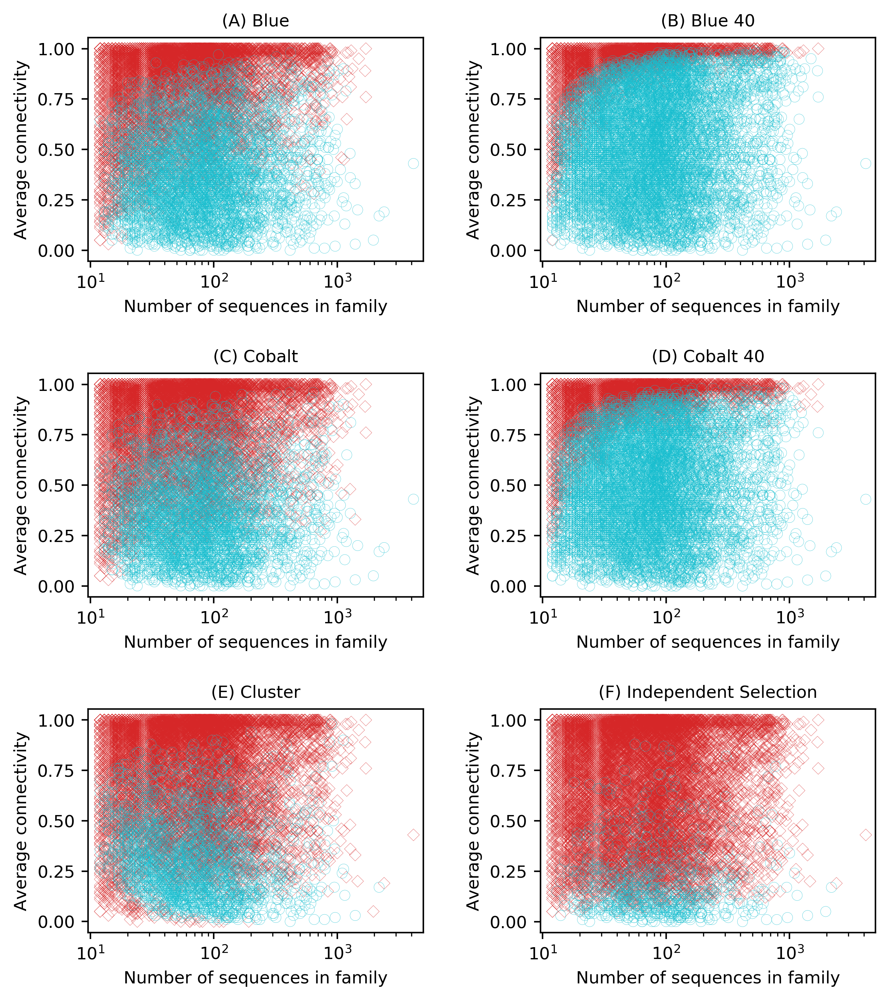

In [10]:
plt.figure( figsize=(7.5, 8.75), dpi=400)
#plt.subplots(sharex=True, sharey=True)
plt.subplots_adjust(hspace=.5, wspace=.35)
plt.subplot(321)
pf_scatter(s_blue, "(A) Blue",1)
plt.subplot(322)
pf_scatter(s_blue, "(B) Blue 40",40)
plt.subplot(323)
pf_scatter(s_cobalt,'(C) Cobalt',1)
plt.subplot(324)
pf_scatter(s_cobalt,  '(D) Cobalt 40',40)
plt.subplot(325)
pf_scatter(s_cluster, "(E) Cluster",1)
plt.subplot(326)
pf_scatter(s_random70,"(F) Independent Selection",1)
plt.savefig("/n/home01/spetti/figures/seed_pf.pdf")

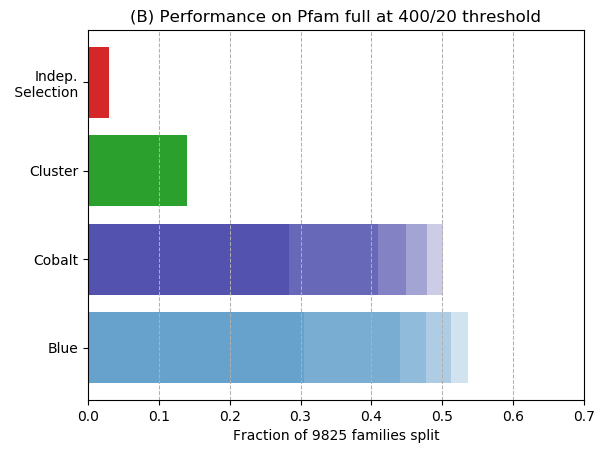

In [11]:
plt.rcdefaults()
#plt.figure()
fig, ax = plt.subplots()
#plt.figure( figsize=(7.5, 8.75), dpi=400)
#fig, ax = plt.subplots()
    
algs = ['Indep.\n Selection','Cluster', 'Cobalt', 'Blue']
y_pos = np.arange(len(algs))
ax.xaxis.grid( linestyle='--', linewidth=.75) 

for i in [40,20,10,5,1]:
    performance5 = [pass_rate(f_cobalt,i), pass_rate(f_blue, i)]
    ax.barh(y_pos[2:], performance5, align='center', color=['darkblue','tab:blue'], alpha=.2)
    
performance = [pass_rate(f_random70),pass_rate(f_cluster)]
ax.barh(y_pos[:2], performance, align='center',color=['tab:red','tab:green'])


ax.set_yticks(y_pos)
ax.set_yticklabels(algs)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlim(0,.7)


ax.set_xlabel('Fraction of '+str(len(f_cluster))+ ' families split')
ax.set_title('(B) Performance on Pfam full at 400/20 threshold')
plt.savefig("/n/home01/spetti/figures/full_performance.pdf")

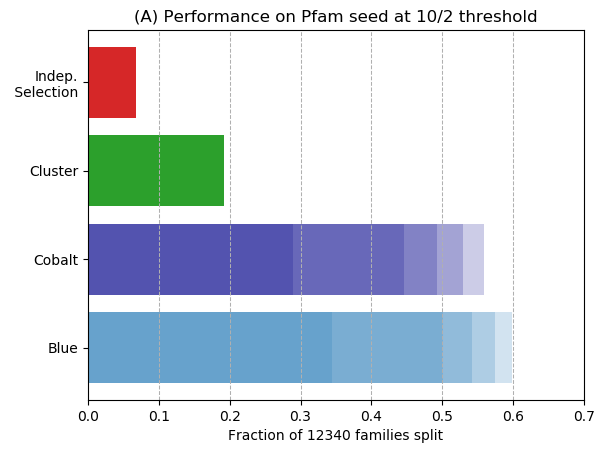

In [12]:
plt.rcdefaults()
fig, ax = plt.subplots()
    
algs = ['Indep.\n Selection','Cluster', 'Cobalt', 'Blue']
ax.xaxis.grid( linestyle='--', linewidth=.75) 
y_pos = np.arange(len(algs))
for i in [40,20,10,5,1]:
    performance5 = [pass_rate(s_cobalt,i), pass_rate(s_blue, i)]
    ax.barh(y_pos[2:], performance5, align='center', color=['darkblue','tab:blue'], alpha=.2)
    
performance = [pass_rate(s_random70),pass_rate(s_cluster)]
ax.barh(y_pos[:2], performance, align='center',color=['tab:red','tab:green'])


ax.set_yticks(y_pos)
ax.set_yticklabels(algs)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Fraction of '+str(len(s_cluster))+ ' families split')
ax.set_title('(A) Performance on Pfam seed at 10/2 threshold')
ax.set_xlim(0,.7)

plt.savefig("/n/home01/spetti/figures/seed_performance.pdf")

In [13]:
for alg in [f_blue, f_cobalt, f_cluster, f_random70]:
    print(pass_rate(alg,1))

0.3053867545576269
0.2841441074699776
0.13974554707379136
0.030121094942505342


In [14]:
for alg in [f_blue, f_cobalt]:
    print(pass_rate(alg,40))

0.5364095169430425
0.5015265621819662


In [15]:
for alg in [s_blue, s_cobalt, s_cluster, s_random70]:
    print(pass_rate(alg,1))

0.34416531604538086
0.2899513776337115
0.19149108589951377
0.0679902755267423


In [16]:
for alg in [s_blue, s_cobalt]:
    print(pass_rate(alg,40))

0.5981361426256078
0.5585899513776337
